## Problem 1 a

In [3]:
using Interpolations 
using Plots


In [4]:
# Setting up the five Functions
f1(x) = exp(2*x+2)
f2(x) = min(max(-1, 4*(x-1/5)), 1)
f3(x) = -2*x^(-1/2)
f4(x) = 1/(1+x^2)


f4 (generic function with 1 method)

In [5]:
# Setting up what is required for Lagrange interpolation
function vandermonde(X)
    n = length(X)
    V = [xi^s for xi in X, s in 0:n-1]
    return V
end

lagrange(X,y)  = vandermonde(X)\y

function evaluate(a, x)
    xi = 1
    v  = 0.0
    for ai in a
        v += ai * xi 
        xi *= x
    end
    return v
    # return sum(
    #     a[s] * x^(s-1)
    #     for s in eachindex(a)
    # )
end

# Setiting up what is required for Chebyshev polynomials
T(n, x) = cos(n * acos(x))

# Setting up what is required for Cubic Splines
# We will be using CubicSplineInterpolation


T (generic function with 1 method)

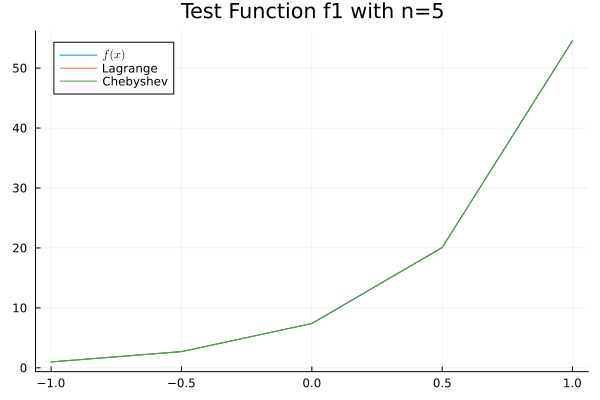

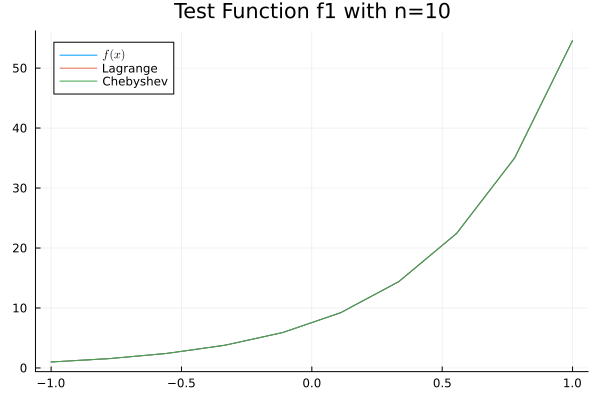

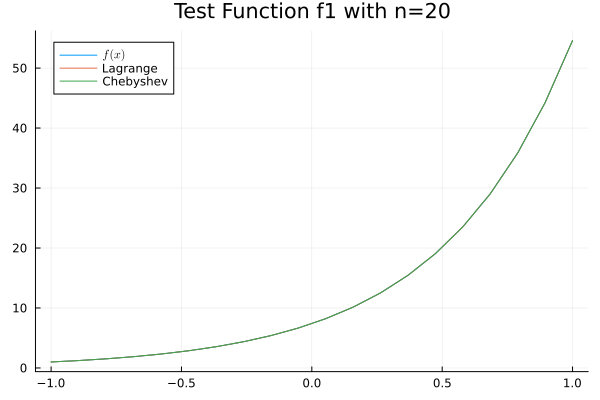

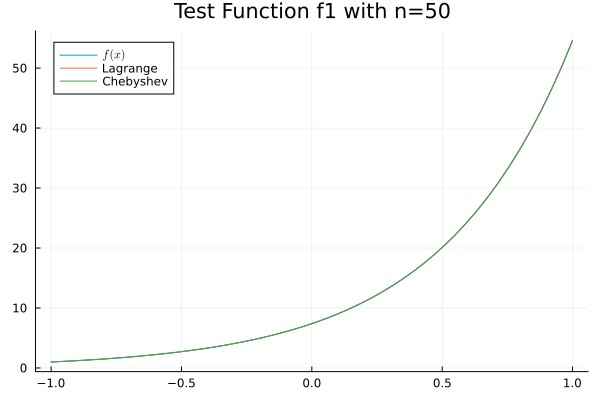

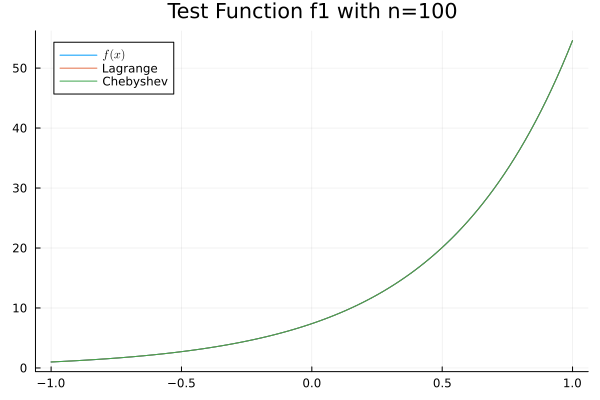

...

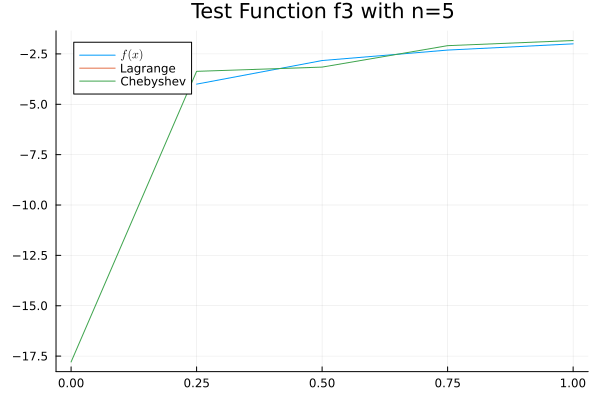

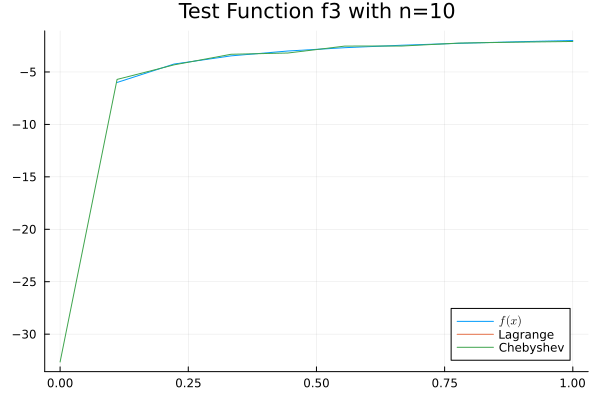

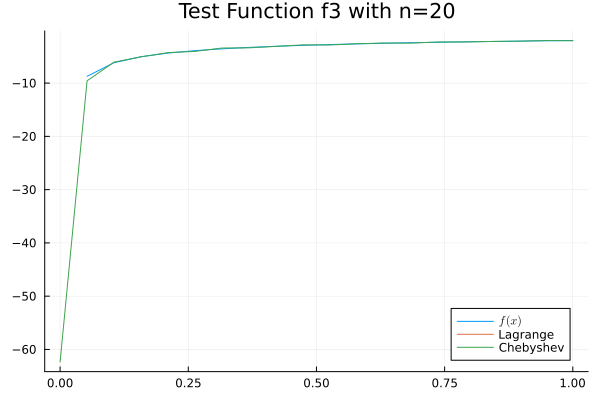

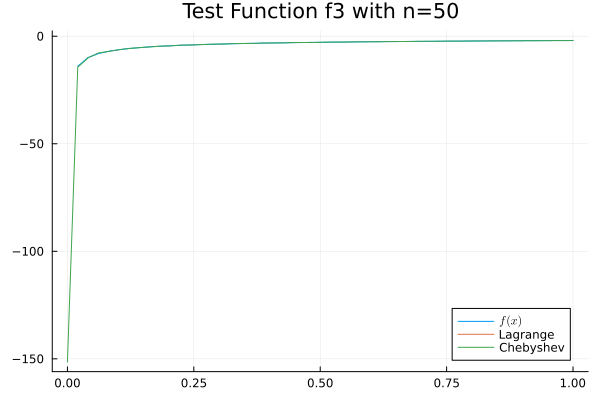

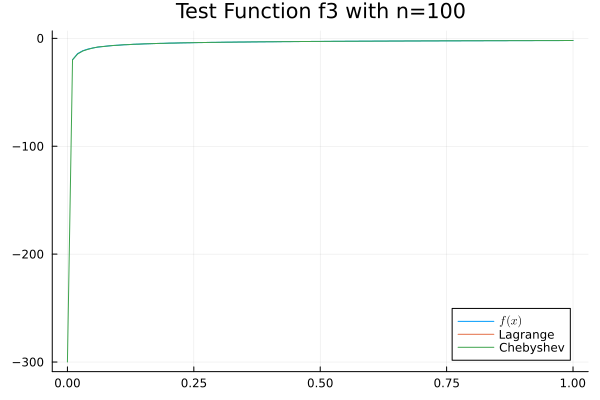

ArgumentError: ArgumentError: matrix contains Infs or NaNs

In [17]:
# Approximating f1 with Chebyshev polynomials, Lagrange polynomials, linear interpolation and cubic splines
# using grid sizes n= 5, 10, 20, 50, 100
grid_size = (5, 10, 20, 50, 100)
ranges = [[-1, 1], [-1, 1], [0, 1], [-5, 5]]
for (i, f) in enumerate((f1, f2, f3, f4))
    for (j, n) in enumerate(grid_size)

        range = ranges[i]

        xg = LinRange(range[1], range[2], n) 
        p = plot(title = "Test Function f$i with n=$n")
        plot!(xg, f, label = raw"$f(x)$")

        x = LinRange(range[1], range[2], 1000) 
        y = f.(x)

        ## Plot with Lagrange
        a = lagrange(x, y)
        plot!(xg, x -> evaluate(a, x), label="Lagrange")

        ## Plot with Chebyshev
        m = n+1
        a = range[1]
        b = range[2]
        z = [-cos((2k -1)/(2m) * π) for k = 1:m] # interpolation points
        x = (z .+ 1) .* (b - a)/2 .+ a

        y = f.(x)
        c = map(0:m) do i 
            numerator   = sum(y[k] * T(i, z[k]) for k in 1:m)
            denominator = sum(T(i, z[k])^2      for k in 1:m)
            return numerator/denominator

        # ## Plot with Cubic Splines
        # x = LinRange(range[1], range[2], n) 
        # # y = f.(x)
        # f̂ = CubicSplineInterpolation(x, y)
        # plot!(x, f̂.(x), label = "Cubic Splines")

        end

    
    approx(x) = sum(
        ci * T(i, 2 * (x-a)/(b-a) - 1) 
        for (ci, i) in zip(c, 0:n)
    )
    plot!(xg, approx, label = "Chebyshev")
    display(p)
    end
    ## Plot with Linear Interpolation 



    

end



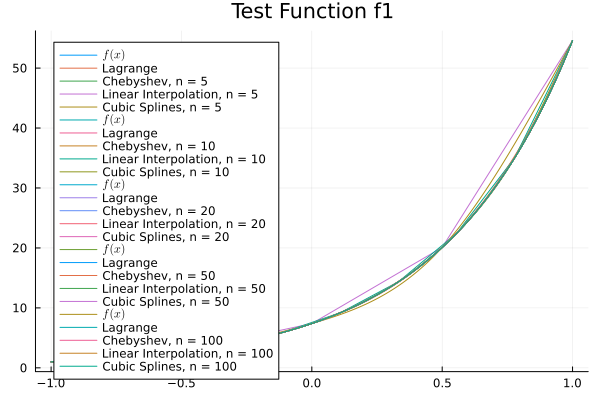

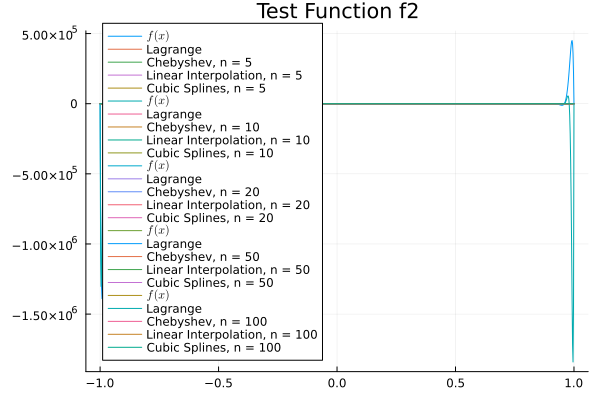

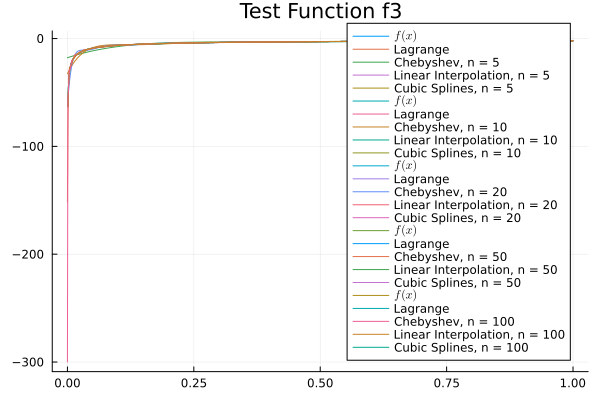

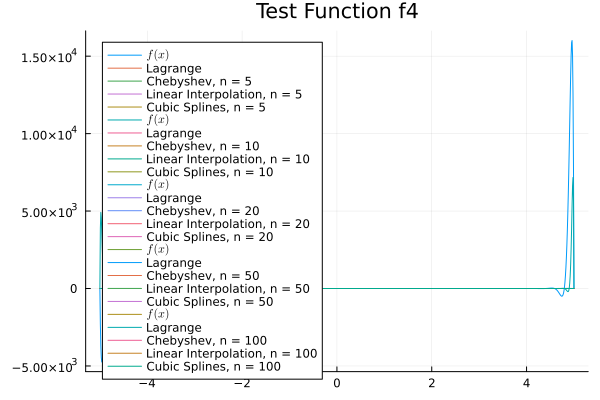

In [18]:
using Plots
using Interpolations

# Define functions
f1(x) = exp(2*x + 2)
f2(x) = min(max(-1, 4*(x - 1/5)), 1)
f3(x) = -2 * x^(-1/2)
f4(x) = 1 / (1 + x^2)

grid_size = (5, 10, 20, 50, 100)
ranges = [[-1, 1], [-1, 1], [0, 1], [-5, 5]]

# Loop over each function
for (i, f) in enumerate((f1, f2, f3, f4))
    p = plot(title = "Test Function f$i")

    # Loop over each value of n
    for (j, n) in enumerate(grid_size)
        range = ranges[i]

        # Generate x values for plotting
        xg = LinRange(range[1], range[2], 1000)
        plot!(xg, f, label = raw"$f(x)$")

        # Generate interpolation points
        x = LinRange(range[1], range[2], n)
        y = f.(x)

        # Plot with Lagrange
        a = lagrange(x, y)
        plot!(xg, x -> evaluate(a, x), label = "Lagrange")

        # Plot with Chebyshev
        m = n + 1
        a_val = range[1]
        b_val = range[2]
        z = [-cos((2k - 1)/(2m) * π) for k in 1:m] # interpolation points
        x_cheb = (z .+ 1) .* (b_val - a_val)/2 .+ a_val
        y_cheb = f.(x_cheb)
        c = [sum(y_cheb[k] * T(i, z[k]) for k in 1:m) / sum(T(i, z[k])^2 for k in 1:m) for i in 0:n]

        approx_cheb(x) = sum(ci * T(i, 2 * (x - a_val)/(b_val - a_val) - 1) for (ci, i) in zip(c, 0:n))
        plot!(xg, approx_cheb, label = "Chebyshev, n = $n")

        # Linear Interpolation
        itp_linear = interpolate((x, ), y, Gridded(Linear()))
        plot!(xg, itp_linear(xg), label = "Linear Interpolation, n = $n")


        # Cubic Splines
        x = LinRange(range[1], range[2], n)
        y = f.(x)
        f̂ = CubicSplineInterpolation(x, y)
        
        plot!(xg, f̂.(xg), label = "Cubic Splines, n = $n")

    end

    display(p)
end


In [6]:
using Plots
using Interpolations

# Define functions
f1(x) = exp(2*x + 2)
f2(x) = min(max(-1, 4*(x - 1/5)), 1)
f3(x) = -2 * x^(-1/2)
f4(x) = 1 / (1 + x^2)

grid_size = (5, 10, 20, 50, 100)
ranges = [[-1, 1], [-1, 1], [0, 1], [-5, 5]]

# Loop over each function
for (i, f) in enumerate((f1, f2, f3, f4))
    p = plot(layout=(1, 1), title="Test Function f$i", legend=:bottomright)

    # Loop over each value of n
    for (j, n) in enumerate(grid_size)
        range = ranges[i]

        # Generate x values for plotting
        xg = LinRange(range[1], range[2], 1000)
        plot!(xg, f, label=raw"$f(x)$", color=:black)

        # Generate interpolation points
        x = LinRange(range[1], range[2], n)
        y = f.(x)

        # Plot with Lagrange
        a = lagrange(x, y)
        plot!(xg, x -> evaluate(a, x), label="Lagrange, n=$n", linestyle=:dash)

        # Plot with Chebyshev
        m = n + 1
        a_val = range[1]
        b_val = range[2]
        z = [-cos((2k - 1)/(2m) * π) for k in 1:m] # interpolation points
        x_cheb = (z .+ 1) .* (b_val - a_val)/2 .+ a_val
        y_cheb = f.(x_cheb)
        c = [sum(y_cheb[k] * T(i, z[k]) for k in 1:m) / sum(T(i, z[k])^2 for k in 1:m) for i in 0:n]

        approx_cheb(x) = sum(ci * T(i, 2 * (x - a_val)/(b_val - a_val) - 1) for (ci, i) in zip(c, 0:n))
        plot!(xg, approx_cheb, label="Chebyshev, n=$n", linestyle=:dot)

        # Linear Interpolation
        itp_linear = interpolate((x,), y, Gridded(Linear()))
        plot!(xg, itp_linear(xg), label="Linear Interpolation, n=$n", linestyle=:dashdot)

        # Cubic Splines
        x = LinRange(range[1], range[2], n)
        y = f.(x)
        f̂ = CubicSplineInterpolation(x, y)
        plot!(xg, f̂.(xg), label="Cubic Splines, n=$n", linestyle=:solid)
    end
    display(p)

end



ArgumentError: ArgumentError: Package Interpolations not found in current path.
- Run `import Pkg; Pkg.add("Interpolations")` to install the Interpolations package.

A plot of the errors

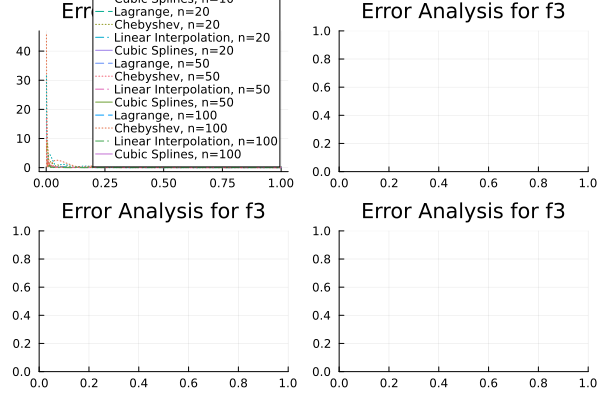

In [19]:
using Plots
using Interpolations

# Define functions
f1(x) = exp(2*x + 2)
f2(x) = min(max(-1, 4*(x - 1/5)), 1)
f3(x) = -2 * x^(-1/2)
f4(x) = 1 / (1 + x^2)

grid_size = (5, 10, 20, 50, 100)
ranges = [[-1, 1], [-1, 1], [0, 1], [-5, 5]]

# Loop over each function
for (i, f) in enumerate((f1, f2, f3, f4))

    p = plot(layout=(2, 2), title="Error Analysis for f$i", legend=:bottomright)

    # Loop over each value of n
    for (j, n) in enumerate(grid_size)
        range = ranges[i]

        # Generate interpolation points
        x = LinRange(range[1], range[2], n)
        y = f.(x)

        # Lagrange
        a = lagrange(x, y)
        xg = LinRange(range[1], range[2], 1000)

        error_lagrange = abs.(f.(x) .- a)
        plot!(p, xg, error_lagrange, label="Lagrange, n=$n", linestyle=:dash)

        # Chebyshev
        m = n + 1
        a_val = range[1]
        b_val = range[2]
        z = [-cos((2k - 1)/(2m) * π) for k in 1:m]
        x_cheb = (z .+ 1) .* (b_val - a_val)/2 .+ a_val
        y_cheb = f.(x_cheb)
        c = [sum(y_cheb[k] * T(i, z[k]) for k in 1:m) / sum(T(i, z[k])^2 for k in 1:m) for i in 0:n]
        approx_cheb(x) = sum(ci * T(i, 2 * (x - a_val)/(b_val - a_val) - 1) for (ci, i) in zip(c, 0:n))
        error_cheb = abs.(f.(xg) .- approx_cheb.(xg))
        plot!(p, xg, error_cheb, label="Chebyshev, n=$n", linestyle=:dot)

        # Linear Interpolation
        itp_linear = interpolate((x,), y, Gridded(Linear()))
        error_linear = abs.(f.(xg) .- itp_linear(xg))
        plot!(p, xg, error_linear, label="Linear Interpolation, n=$n", linestyle=:dashdot)

        # Cubic Splines
        x = LinRange(range[1], range[2], n)
        y = f.(x)
        f̂ = CubicSplineInterpolation(x, y)
        error_cubic = abs.(f.(xg) .- f̂.(xg))
        plot!(p, xg, error_cubic, label="Cubic Splines, n=$n", linestyle=:solid)
    end
    display(p)
end


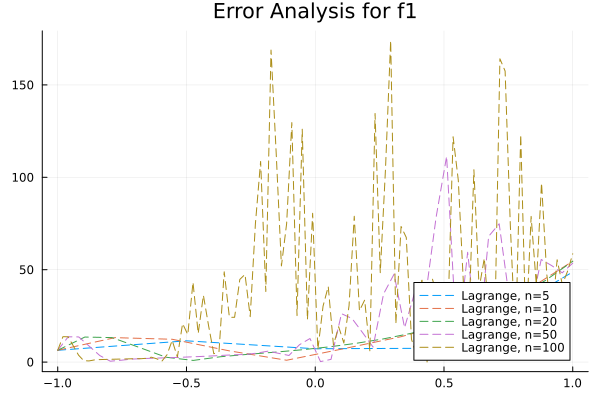

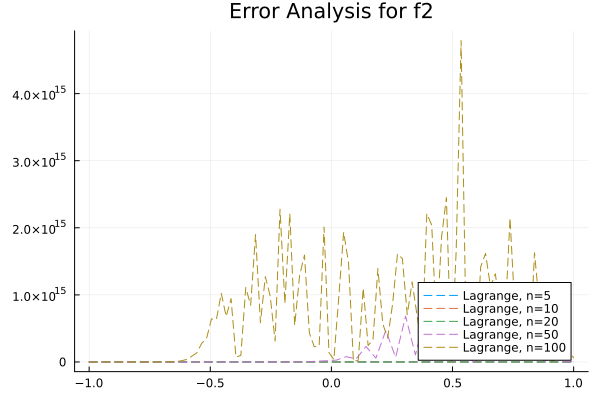

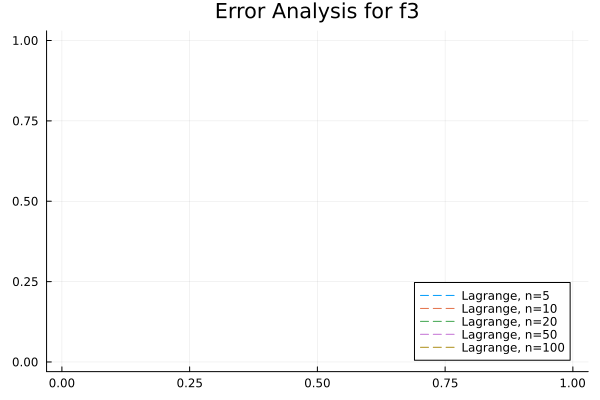

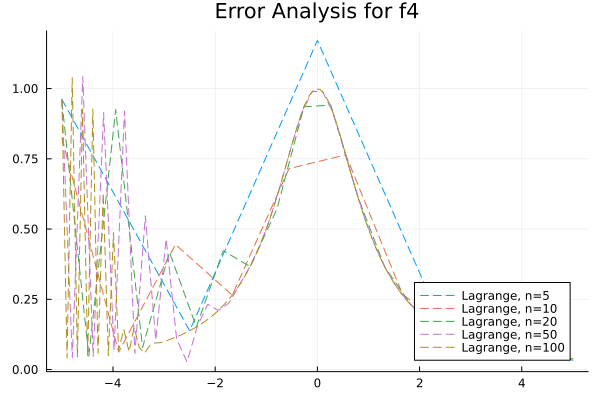

In [20]:
using Plots
using Interpolations

# Define functions
f1(x) = exp(2*x + 2)
f2(x) = min(max(-1, 4*(x - 1/5)), 1)
f3(x) = -2 * x^(-1/2)
f4(x) = 1 / (1 + x^2)

grid_size = (5, 10, 20, 50, 100)
ranges = [[-1, 1], [-1, 1], [0, 1], [-5, 5]]

# Loop over each function
for (i, f) in enumerate((f1, f2, f3, f4))

    p = plot(title="Error Analysis for f$i", legend=:bottomright)

    # Loop over each value of n
    for (j, n) in enumerate(grid_size)
        range = ranges[i]

        # Generate interpolation points
        x = LinRange(range[1], range[2], n)
        y = f.(x)

        # Lagrange
        a = lagrange(x, y)
        xg = LinRange(range[1], range[2], 1000)

        error_lagrange = abs.(f.(x) .- a)
        plot!(x, error_lagrange, label="Lagrange, n=$n", linestyle=:dash)


        # # Chebyshev
        # m = n + 1
        # a_val = range[1]
        # b_val = range[2]
        # z = [-cos((2k - 1)/(2m) * π) for k in 1:m]
        # x_cheb = (z .+ 1) .* (b_val - a_val)/2 .+ a_val
        # y_cheb = f.(x_cheb)
        # c = [sum(y_cheb[k] * T(i, z[k]) for k in 1:m) / sum(T(i, z[k])^2 for k in 1:m) for i in 0:n]
        # approx_cheb(x) = sum(ci * T(i, 2 * (x - a_val)/(b_val - a_val) - 1) for (ci, i) in zip(c, 0:n))
        # error_cheb = abs.(f.(xg) .- approx_cheb.(xg))
        # plot!(p, xg, error_cheb, label="Chebyshev, n=$n", linestyle=:dot)

        # # Linear Interpolation
        # itp_linear = interpolate((x,), y, Gridded(Linear()))
        # error_linear = abs.(f.(xg) .- itp_linear(xg))
        # plot!(p, xg, error_linear, label="Linear Interpolation, n=$n", linestyle=:dashdot)

        # # Cubic Splines
        # x = LinRange(range[1], range[2], n)
        # y = f.(x)
        # f̂ = CubicSplineInterpolation(x, y)
        # error_cubic = abs.(f.(xg) .- f̂.(xg))
        # plot!(p, xg, error_cubic, label="Cubic Splines, n=$n", linestyle=:solid)
    end
    display(p)

end

In [9]:
using Plots
using Interpolations

# Define functions
f1(x) = exp(2*x + 2)
f2(x) = min(max(-1, 4*(x - 1/5)), 1)
f3(x) = -2 * x^(-1/2)
f4(x) = 1 / (1 + x^2)

grid_size = (5, 10, 20, 50, 100)
ranges = [[-1, 1], [-1, 1], [0, 1], [-5, 5]]

# Loop over each function
for (i, f) in enumerate((f1, f2, f3, f4))
    p = plot(title="Error Analysis for f$i", legend=:bottomright)

    # Loop over each value of n
    for (j, n) in enumerate(grid_size)
        range = ranges[i]

        # Generate interpolation points
        x = LinRange(range[1], range[2], n)
        y = f.(x)

        xg = LinRange(range[1], range[2], 1000)

        # Chebyshev
        m = n + 1
        a_val = range[1]
        b_val = range[2]
        z = [-cos((2k - 1)/(2m) * π) for k in 1:m]
        x_cheb = (z .+ 1) .* (b_val - a_val)/2 .+ a_val
        y_cheb = f.(x_cheb)
        c = [sum(y_cheb[k] * T(i, z[k]) for k in 1:m) / sum(T(i, z[k])^2 for k in 1:m) for i in 0:n]
        approx_cheb(x) = sum(ci * T(i, 2 * (x - a_val)/(b_val - a_val) - 1) for (ci, i) in zip(c, 0:n))
        error_cheb = abs.(f.(xg) .- approx_cheb.(xg))
        plot!(p, xg, error_cheb, label="Chebyshev, n=$n", linestyle=:dot)

    end
    display(p)
end

ArgumentError: ArgumentError: Package Interpolations not found in current path.
- Run `import Pkg; Pkg.add("Interpolations")` to install the Interpolations package.

In [10]:
using Plots
using Interpolations

# Define functions
f1(x) = exp(2*x + 2)
f2(x) = min(max(-1, 4*(x - 1/5)), 1)
f3(x) = -2 * x^(-1/2)
f4(x) = 1 / (1 + x^2)

grid_size = (5, 10, 20, 50, 100)
ranges = [[-1, 1], [-1, 1], [0, 1], [-5, 5]]

# Loop over each function
for (i, f) in enumerate((f1, f2, f3, f4))
    p = plot(title="Error Analysis for f$i", legend=:bottomright)

    # Loop over each value of n
    for (j, n) in enumerate(grid_size)
        range = ranges[i]

        # Generate interpolation points
        x = LinRange(range[1], range[2], n)
        y = f.(x)

        xg = LinRange(range[1], range[2], 1000)

        # Linear Interpolation
        itp_linear = interpolate((x,), y, Gridded(Linear()))
        error_linear = abs.(f.(xg) .- itp_linear(xg))
        plot!(p, xg, error_linear, label="Linear Interpolation, n=$n", linestyle=:dashdot)

    end
    display(p)
end

ArgumentError: ArgumentError: Package Interpolations not found in current path.
- Run `import Pkg; Pkg.add("Interpolations")` to install the Interpolations package.

In [11]:
using Plots
using Interpolations

# Define functions
f1(x) = exp(2*x + 2)
f2(x) = min(max(-1, 4*(x - 1/5)), 1)
f3(x) = -2 * x^(-1/2)
f4(x) = 1 / (1 + x^2)

grid_size = (5, 10, 20, 50, 100)
ranges = [[-1, 1], [-1, 1], [0, 1], [-5, 5]]

# Loop over each function
for (i, f) in enumerate((f1, f2, f3, f4))
    p = plot(title="Error Analysis for f$i", legend=:bottomright)

    # Loop over each value of n
    for (j, n) in enumerate(grid_size)
        range = ranges[i]

        # Generate interpolation points
        x = LinRange(range[1], range[2], n)
        y = f.(x)

        xg = LinRange(range[1], range[2], 1000)
        # Cubic Splines
        x = LinRange(range[1], range[2], n)
        y = f.(x)
        f̂ = CubicSplineInterpolation(x, y)
        error_cubic = abs.(f.(xg) .- f̂.(xg))
        plot!(p, xg, error_cubic, label="Cubic Splines, n=$n", linestyle=:solid)

    end
    display(p)
end

ArgumentError: ArgumentError: Package Interpolations not found in current path.
- Run `import Pkg; Pkg.add("Interpolations")` to install the Interpolations package.

1 b i

In [11]:
# Setting up the five Functions
f1(x) = exp(2*x+2)
f2(x) = min(max(-1, 4*(x-1/5)), 1)
f3(x) = -2*x^(-1/2)
f4(x) = 1/(1+(x^2))

f4 (generic function with 1 method)

In [37]:
using LinearAlgebra

function vandermonde(X)
    n = length(X)
    V = [xi^(s-1) for xi in X, s in 1:n]  # Corrected range of powers
    return V
end


function lagrange(X, y)
    V = vandermonde(X)
    coeffs = lu(V) \ y
    return coeffs
end

function evaluate(a, x)
    xi = 1
    v  = 0.0
    for ai in a
        v += ai * xi 
        xi *= x
    end
    return v
    # return sum(
    #     a[s] * x^(s-1)
    #     for s in eachindex(a)
    # )
end

function errors_f(f, n, a, b)
    errors_lagrangian = []
    errors_cheb = []
    errors_linear = []
    errors_cubic = []
    for n_value in n
        # Generate evaluation points
        xg = LinRange(a, b, 1000)
        x = LinRange(a, b, n_value)
        y = f.(x)
        # Lagrange Interpolation
        approx_lagrange = lagrange(x, y)
        interp_lagrange_values = evaluate.(Ref(approx_lagrange), xg)
        error_lagrange = sum(abs2, f.(xg) .- interp_lagrange_values) / 1000
        push!(errors_lagrangian, error_lagrange)

        # Chebyshev Interpolation
        m = n_value + 1
        z = [cos((2k - 1)/(2m) * π) for k in 1:m]
        x_cheb = (z .+ 1) .* (b - a) / 2 .+ a
        y_cheb = f.(x_cheb)
        c = [sum(y_cheb[k] * T(i, z[k]) for k in 1:m) / sum(T(i, z[k])^2 for k in 1:m) for i in 0:n_value]
        approx_cheb(x) = sum(ci * T(i, 2 * (x - a) / (b - a) - 1) for (ci, i) in zip(c, 0:n_value))
        error_cheb = sum(abs2, f.(xg) .- approx_cheb.(xg)) / 1000
        push!(errors_cheb, error_cheb)


        # Linear Interpolation
        itp_linear = interpolate((x,), y, Gridded(Linear()))
        error_linear = sum(abs2, f.(xg) .- itp_linear(xg)) / 1000
        push!(errors_linear, error_linear)

        # Cubic Splines Interpolation
        f̂ = CubicSplineInterpolation(x, y)
        error_cubic = sum(abs2, f.(xg) .- f̂.(xg)) / 1000
        push!(errors_cubic, error_cubic)
    end  
    return errors_lagrangian, errors_cheb, errors_linear, errors_cubic
end


errors_f (generic function with 1 method)

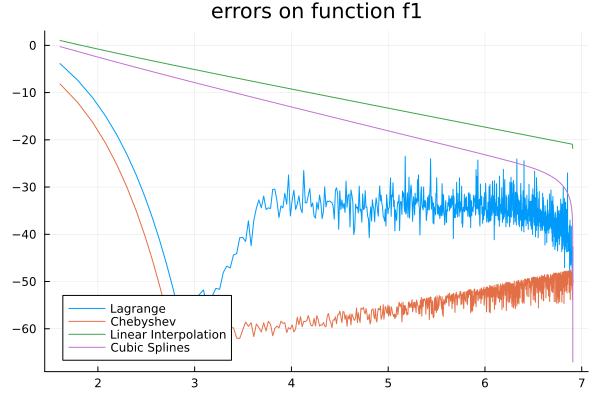

In [19]:
n = [i for i in 5:1000]
# For f1
lagrange_error, cheb_error, linear_error, cubic_error = errors_f(f1, n, -1, 1)
p = plot(title = "errors on function f1")
plot!(log.(n), log.(lagrange_error), label="Lagrange")
plot!(log.(n), log.(cheb_error), label="Chebyshev")
plot!(log.(n), log.(linear_error), label="Linear Interpolation")
plot!(log.(n), log.(cubic_error), label="Cubic Splines")
display(p)


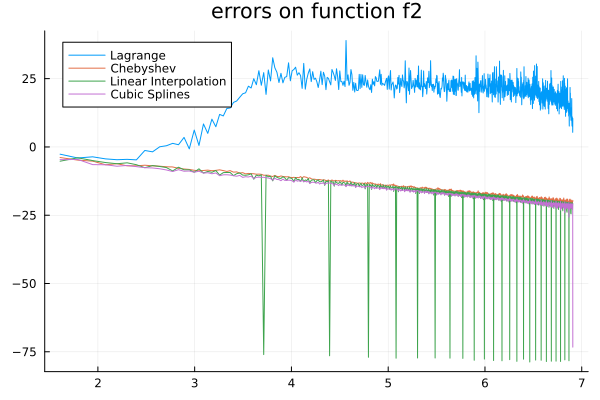

In [8]:
# For f2
lagrange_error, cheb_error, linear_error, cubic_error = errors_f(f2, n, -1, 1)
p = plot(title = "errors on function f2")
plot!(log.(n), log.(lagrange_error), label="Lagrange")
plot!(log.(n), log.(cheb_error), label="Chebyshev")
plot!(log.(n), log.(linear_error), label="Linear Interpolation")
plot!(log.(n), log.(cubic_error), label="Cubic Splines")
display(p)

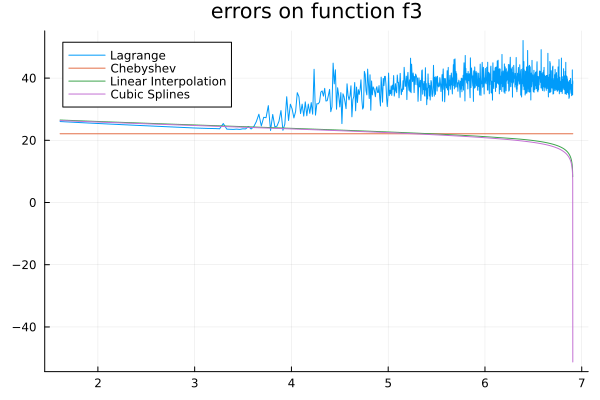

In [9]:
# For f3 not working because at 0, f3 is -infinity so using 1e-12 instead to replicate 0
lagrange_error, cheb_error, linear_error, cubic_error = errors_f(f3, n, 1e-12, 1)
p = plot(title = "errors on function f3")
plot!(log.(n), log.(lagrange_error), label="Lagrange")
plot!(log.(n), log.(cheb_error), label="Chebyshev")
plot!(log.(n), log.(linear_error), label="Linear Interpolation")
plot!(log.(n), log.(cubic_error), label="Cubic Splines")
display(p)

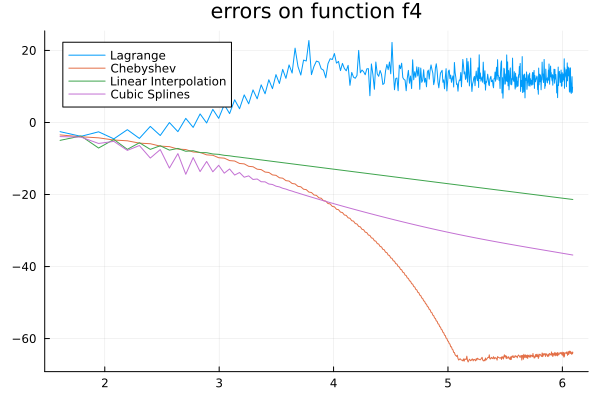

In [57]:
# For f4
# Lagrange method stops working after n greater than 442
n = [i for i in 5:442]

lagrange_error, cheb_error, linear_error, cubic_error = errors_f(f4, n, -5, 5)
p = plot(title = "errors on function f4")
plot!(log.(n), log.(lagrange_error), label="Lagrange")
plot!(log.(n), log.(cheb_error), label="Chebyshev")
plot!(log.(n), log.(linear_error), label="Linear Interpolation")
plot!(log.(n), log.(cubic_error), label="Cubic Splines")
display(p)

## Problem 2

Part a

In [58]:
using Optim
a=-10
b=0.5
alpha=1/2
beta=0.9
function v(k)
    return a + b*log(k)
end

v (generic function with 1 method)

In [64]:
function objective(c, k_prime)
    return log(c) + beta * v(k_prime)
end
function constraint_1(c, k_prime)
    return c + k_prime = k^alpha
end
function constraint_2(c)
    return 0<=c<=k^alpha
end
# if we minimise the negative of our objective this is the same as maximising our objective
optimize(c, k_prime->objective(c, k_prime), c->constraint_1(c, k_prime))

constraint_2 (generic function with 1 method)

In [67]:
# if we minimise the negative of our objective this is the same as maximising our objective
optimize(c, k_prime->objective(c, k_prime), c->constraint_1(c, k_prime))

UndefVarError: UndefVarError: `c` not defined

In [90]:
using Optim
# Define parameters
a=-10
b=0.5
alpha=1/2
beta=0.9

# Define the function v(k)
function v(k)
    return a + b*log(k)
end

# Define the optimization problem
function optimization_problem(k_prime; k)
    return - (log(k^alpha - k_prime) + beta * v(k_prime))
end
function minimiser(k)
    result = (k_prime->optimization_problem(k_prime; k), 0.5)
    result
    return 
end




nothing


In [132]:
using Optim

# Define parameters
a = -10
b = 0.5
alpha = 1/2
beta = 0.9

# Define the function v(k)
function v(k,; a=-10, b=0.5)
    return a + b * log(k)
end

# Define the optimization problem
function optimization_problem(k_prime, k,; alpha=1/2, beta=0.9)
    c = k^alpha .- k_prime
    return - (log(c) + beta * v(k_prime))
end


# Define the minimizer function
function minimiser(k)
    #srand(1234)  # Set seed for reproducibility
    k_prime_init = abs(randn()) * k^alpha
    lower_bounds = [0.0]
    upper_bounds = [k^alpha]
    function_to_minimise = k_prime -> optimization_problem(k_prime, k)
    result = optimize(function_to_minimise, lower_bounds, upper_bounds, [k_prime_init])
    return result
end

# Test the minimizer function
minimiser(1)


MethodError: MethodError: no method matching -(::Float64, ::Vector{Float64})
For element-wise subtraction, use broadcasting with dot syntax: scalar .- array

Closest candidates are:
  -(!Matched::ChainRulesCore.ZeroTangent, ::Any)
   @ ChainRulesCore C:\Users\reube\.julia\packages\ChainRulesCore\hsloW\src\tangent_arithmetic.jl:101
  -(::Any, !Matched::MutableArithmetics.Zero)
   @ MutableArithmetics C:\Users\reube\.julia\packages\MutableArithmetics\2vhhw\src\rewrite.jl:64
  -(!Matched::ChainRulesCore.NoTangent, ::Any)
   @ ChainRulesCore C:\Users\reube\.julia\packages\ChainRulesCore\hsloW\src\tangent_arithmetic.jl:61
  ...


In [122]:
a = randn(1)*1^(1/2)
a[1]

-0.2874422479097923

In [108]:
k = 1.0
optimal_k_prime = minimiser(k)
println("Optimal k_prime for k = $k: ", optimal_k_prime)
function check(k)
    c = k^alpha - optimal_k_prime
    println("c = $c")
    println("k^alpha = $(k^alpha)")
    return 
end
check(1)

ArgumentError: ArgumentError: Initial x[(1,)]=1.0 is outside of [0.5, 0]

In [105]:
using Optim

# Define the objective function
function objective_function(k, a, b, α, β)
    v(k) = a + b * log(k)
    return -(β * v(k) + log(k^α))
end

# Define the constraint function
function constraint_function!(F, x, k, α)
    F[1] = x[1] + x[2] - k^α
    F[2] = x[1]
    F[3] = x[1] - k^α
end

# Solve the maximization problem
function solve_maximization(k, a, b, α, β)
    objective(x) = objective_function(k, a, b, α, β)
    constraint(x, F) = constraint_function!(F, x, k, α)
    initial_guess = [k^α / 2, k^α / 2]
    lower_bounds = [0.0, 0.0]
    upper_bounds = [k^α, k^α]
    result = optimize(objective, constraint, lower_bounds, upper_bounds, initial_guess)
    return Optim.minimizer(result)
end

# Test the function for different values of k
k_values = [0.5, 1, 5, 9]
solutions = Dict()

for k in k_values
    solution = solve_maximization(k, -10, 0.5, 1/2, 0.9)
    solutions[k] = solution
end

# Visualize the results
using Plots

plot()
for (k, solution) in solutions
    scatter!([k], [solution[1]], label="c, k=$k", xlabel="k", ylabel="c")
end
plot!(title="Optimal consumption (c) for different values of k")


BoundsError: BoundsError: attempt to access 2-element Vector{Float64} at index [3]